# Mehrdad Baradaran - 99222020
## Computer Vision HW03 
## Prof. Mr. Ahmadi

<img src="https://upload.wikimedia.org/wikipedia/commons/thumb/6/6a/Sbu-logo.svg/768px-Sbu-logo.svg.png" width="200" height="200">

#### import libraries

In [18]:
import os
import glob
import cv2
import time
import numpy as np
import matplotlib.pyplot as plt
from skimage.io import imread
from skimage import exposure
from skimage.util import random_noise
from skimage.metrics import peak_signal_noise_ratio as compare_psnr
from scipy.ndimage import gaussian_filter
from scipy.ndimage import uniform_filter, median_filter
import tensorflow as tf
import tensorflow_hub as hub
from PIL import Image
from skimage import restoration
from scipy.signal import fftconvolve
from skimage.restoration import richardson_lucy
from scipy.spatial.distance import cdist
from sklearn.metrics.pairwise import cosine_similarity
from skimage.morphology import disk, dilation
from skimage.filters import sobel
from skimage.io import imshow
from skimage import img_as_float, data
from skimage.io import imshow
from skimage import img_as_ubyte
from skimage import color
from scipy.signal import convolve2d
from skimage import io, restoration, img_as_float
from skimage.filters import unsharp_mask
from skimage.feature import hog
os.environ["TFHUB_DOWNLOAD_PROGRESS"] = "True"

### Q1 - A

#### Estimate a simple point spread function (PSF)

In [42]:
def estimate_psf(kernel_size, sigma):

    psf = np.outer(np.exp(-(np.arange(kernel_size) - kernel_size // 2) ** 2 / (2 * sigma ** 2)), 
                   np.exp(-(np.arange(kernel_size) - kernel_size // 2) ** 2 / (2 * sigma ** 2)))
    return psf

#### Apply a simple sharpening kernel to the image

In [21]:
def apply_sharpening_kernel(image):
    
    sharpening_kernel = np.array([[0, -1, 0],
                                  [-1, 5, -1],
                                  [0, -1, 0]])
    sharpened_image = convolve2d(image, sharpening_kernel, mode='same', boundary='wrap')
    return sharpened_image

#### Apply Laplacian sharpening to the image

In [22]:
def apply_laplacian_sharpening(image):
    
    laplacian_kernel = np.array([[0, -1, 0],
                                 [-1, 4, -1],
                                 [0, -1, 0]])
    sharpened_image = convolve2d(image, laplacian_kernel, mode='same', boundary='wrap')
    return sharpened_image

#### Apply an alternative sharpening filter to the image

In [23]:
def apply_alternative_sharpening(image):
    
    alternative_sharpening_kernel = np.array([[-1, -1, -1],
                                              [-1,  9, -1],
                                              [-1, -1, -1]])
    sharpened_image = convolve2d(image, alternative_sharpening_kernel, mode='same', boundary='wrap')
    return sharpened_image

#### Apply unsharp masking to the image

In [24]:
def apply_unsharp_mask(image, radius=1.0, amount=1.0):
    
    return unsharp_mask(image, radius=radius, amount=amount)

#### Perform blind deconvolution using the Richardson-Lucy algorithm

In [31]:
def blind_deconvolution(image, psf, num_iter=30):
   
    deconvolved = restoration.richardson_lucy(image, psf)
    return deconvolved

In [26]:
# Load and prepare the image
image_path = '/kaggle/input/computer-vision-hw03-data/Q1/1.1.jpg' 
image = img_as_float(io.imread(image_path, as_gray=True))

In [27]:
# Apply sharpening filters
sharpened_image = apply_sharpening_kernel(image)
laplacian_sharpened_image = apply_laplacian_sharpening(image)
alternative_sharpened_image = apply_alternative_sharpening(image)

In [28]:
# Apply unsharp masking
unsharp_image = apply_unsharp_mask(image)

In [43]:
# Estimate the PSF
kernel_size = 7
sigma = 10
psf = estimate_psf(7, 10)

In [44]:
# Perform blind deconvolution
num_iter = 30  # Number of iterations for the Richardson-Lucy algorithm
deconvolved_image = blind_deconvolution(image, psf)

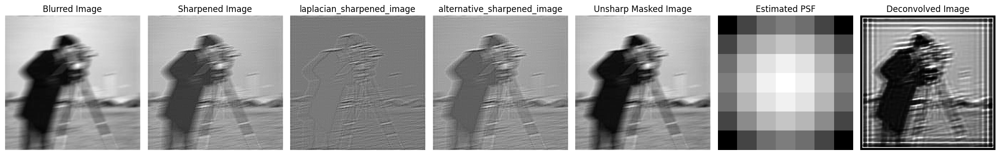

In [45]:
# Plot the results
fig, ax = plt.subplots(1, 7, figsize=(20, 20))

ax[0].imshow(image, cmap='gray')
ax[0].set_title('Blurred Image')
ax[0].axis('off')

ax[1].imshow(sharpened_image, cmap='gray')
ax[1].set_title('Sharpened Image')
ax[1].axis('off')

ax[2].imshow(laplacian_sharpened_image, cmap='gray')
ax[2].set_title('laplacian_sharpened_image')
ax[2].axis('off')

ax[3].imshow(alternative_sharpened_image, cmap='gray')
ax[3].set_title('alternative_sharpened_image')
ax[3].axis('off')

ax[4].imshow(unsharp_image, cmap='gray')
ax[4].set_title('Unsharp Masked Image')
ax[4].axis('off')

ax[5].imshow(psf, cmap='gray')
ax[5].set_title('Estimated PSF')
ax[5].axis('off')

ax[6].imshow(deconvolved_image, cmap='gray')
ax[6].set_title('Deconvolved Image')
ax[6].axis('off')

plt.tight_layout()
plt.show()

### Q1 - B

In [80]:
image_path_2 = r'/kaggle/input/computer-vision-hw03-data/Q1/1.2.jpg' 
image_path_3 = r'/kaggle/input/computer-vision-hw03-data/Q1/1.3.jpg'

In [81]:
image_2 = cv2.imread(image_path_2)
image_3 = cv2.imread(image_path_3)

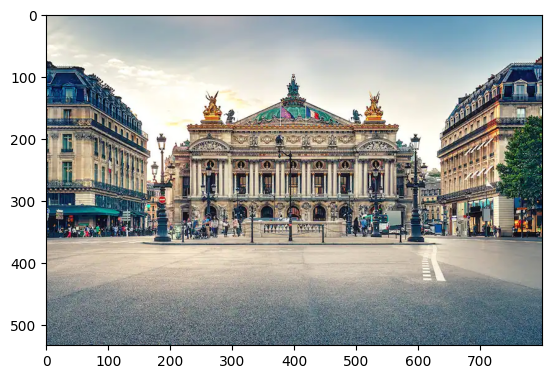

In [82]:
plt.imshow(cv2.cvtColor(image_2, cv2.COLOR_BGR2RGB))

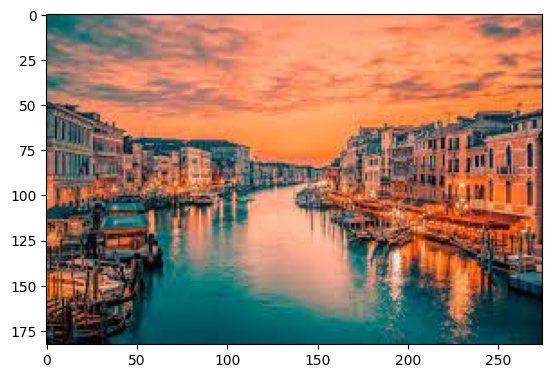

In [83]:
plt.imshow(cv2.cvtColor(image_3, cv2.COLOR_BGR2RGB))

In [84]:
gray_image_2 = cv2.cvtColor(image_2, cv2.COLOR_BGR2GRAY)
gray_image_3 = cv2.cvtColor(image_3, cv2.COLOR_BGR2GRAY)

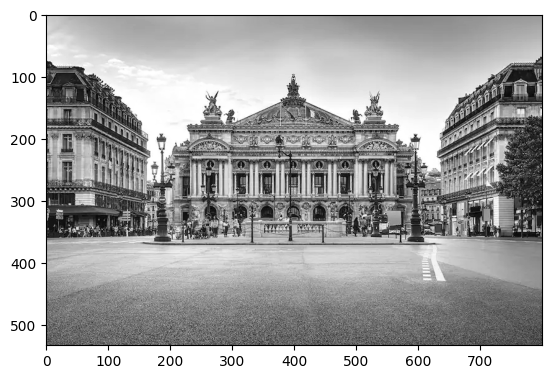

In [85]:
plt.imshow(gray_image_2, cmap='gray')

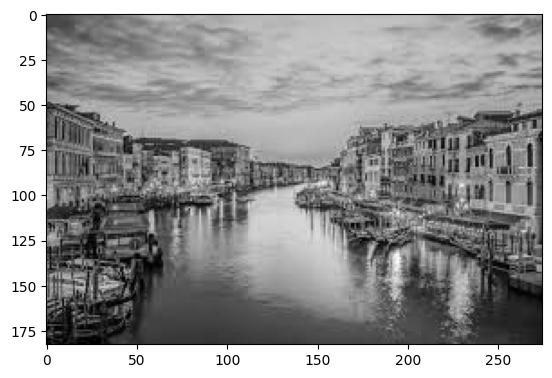

In [86]:
plt.imshow(gray_image_3, cmap='gray')

#### Canny edge detection

In [87]:
edges_2 = cv2.Canny(gray_image_2, 250, 350)
edges_3 = cv2.Canny(gray_image_3, 250, 350)

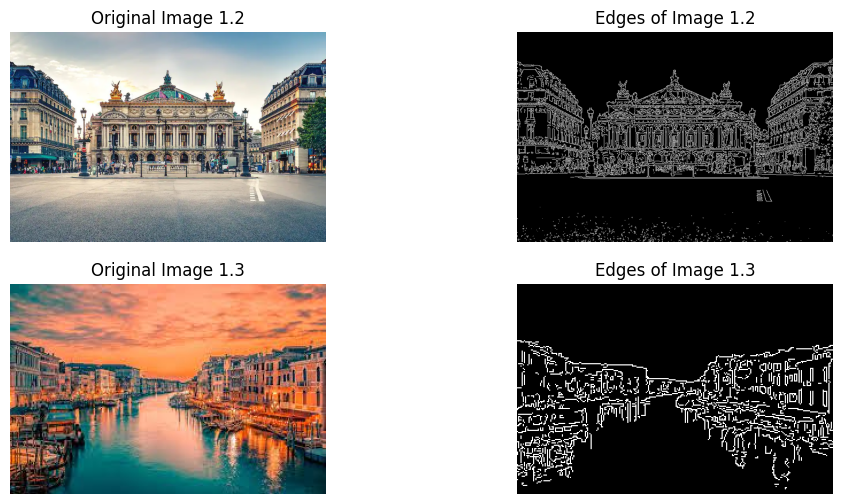

In [88]:
plt.figure(figsize=(12, 6))

plt.subplot(2, 2, 1)
plt.imshow(cv2.cvtColor(image_2, cv2.COLOR_BGR2RGB))
plt.title('Original Image 1.2')
plt.axis('off')

plt.subplot(2, 2, 2)
plt.imshow(edges_2, cmap='gray')
plt.title('Edges of Image 1.2')
plt.axis('off')

plt.subplot(2, 2, 3)
plt.imshow(cv2.cvtColor(image_3, cv2.COLOR_BGR2RGB))
plt.title('Original Image 1.3')
plt.axis('off')

plt.subplot(2, 2, 4)
plt.imshow(edges_3, cmap='gray')
plt.title('Edges of Image 1.3')
plt.axis('off')

plt.show()

#### Soble edge detection

In [89]:
# Apply Sobel operator
sobel_x_2 = cv2.Sobel(gray_image_2, cv2.CV_64F, 1, 0, ksize=3)
sobel_y_2 = cv2.Sobel(gray_image_2, cv2.CV_64F, 0, 1, ksize=3)

sobel_x_3 = cv2.Sobel(gray_image_3, cv2.CV_64F, 1, 0, ksize=3)
sobel_y_3 = cv2.Sobel(gray_image_3, cv2.CV_64F, 0, 1, ksize=3)

In [90]:
# Compute the magnitude of gradients
magnitude_2 = cv2.magnitude(sobel_x_2, sobel_y_2)
magnitude_3 = cv2.magnitude(sobel_x_3, sobel_y_3)

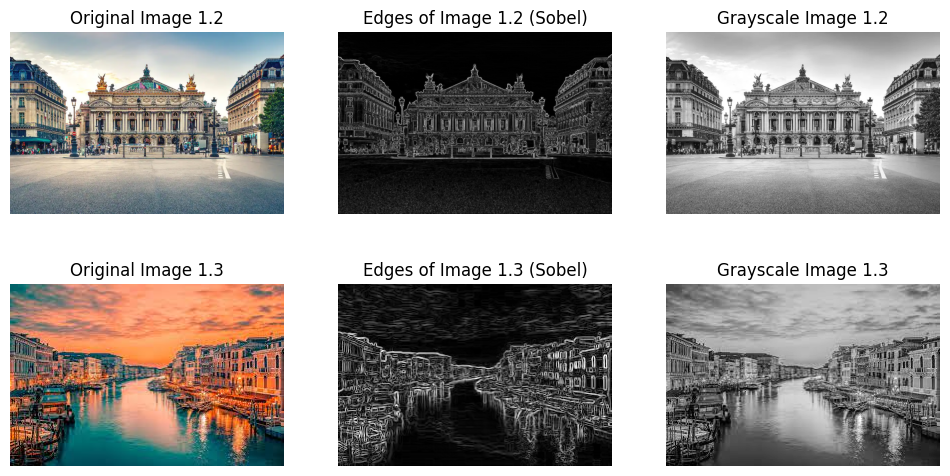

In [91]:
plt.figure(figsize=(12, 6))

plt.subplot(2, 3, 1)
plt.imshow(cv2.cvtColor(image_2, cv2.COLOR_BGR2RGB))
plt.title('Original Image 1.2')
plt.axis('off')

plt.subplot(2, 3, 2)
plt.imshow(magnitude_2, cmap='gray')
plt.title('Edges of Image 1.2 (Sobel)')
plt.axis('off')

plt.subplot(2, 3, 3)
plt.imshow(gray_image_2, cmap='gray')
plt.title('Grayscale Image 1.2')
plt.axis('off')

plt.subplot(2, 3, 4)
plt.imshow(cv2.cvtColor(image_3, cv2.COLOR_BGR2RGB))
plt.title('Original Image 1.3')
plt.axis('off')

plt.subplot(2, 3, 5)
plt.imshow(magnitude_3, cmap='gray')
plt.title('Edges of Image 1.3 (Sobel)')
plt.axis('off')

plt.subplot(2, 3, 6)
plt.imshow(gray_image_3, cmap='gray')
plt.title('Grayscale Image 1.3')
plt.axis('off')

plt.show()

### Q1 - C

In [92]:
# Load the images in RGB
image1 = cv2.imread('/kaggle/input/computer-vision-hw03-data/Q1/1.4.jpg')
image1 = cv2.cvtColor(image1, cv2.COLOR_BGR2RGB)
image2 = cv2.imread('/kaggle/input/computer-vision-hw03-data/Q1/1.5.jpg')
image2 = cv2.cvtColor(image2, cv2.COLOR_BGR2RGB)


In [93]:
# Highboost filter
def highboost_filtering(image, k=1.5):
    blurred = cv2.GaussianBlur(image, (5, 5), 0)
    highboost = cv2.addWeighted(image, 1 + k, blurred, -k, 0)
    return highboost

In [94]:
# Apply highboost filtering
highboost_image1 = highboost_filtering(image1)
highboost_image2 = highboost_filtering(image2)

In [95]:
# Apply highboost filtering
highboost_image1 = highboost_filtering(image1)
highboost_image2 = highboost_filtering(image2)

In [96]:
# Histogram equalization for color image
def equalize_histogram_color(image):
    yuv_image = cv2.cvtColor(image, cv2.COLOR_RGB2YUV)
    yuv_image[:, :, 0] = cv2.equalizeHist(yuv_image[:, :, 0])
    return cv2.cvtColor(yuv_image, cv2.COLOR_YUV2RGB)

In [97]:
# Apply histogram equalization
equalized_image1 = equalize_histogram_color(highboost_image1)
equalized_image2 = equalize_histogram_color(highboost_image2)

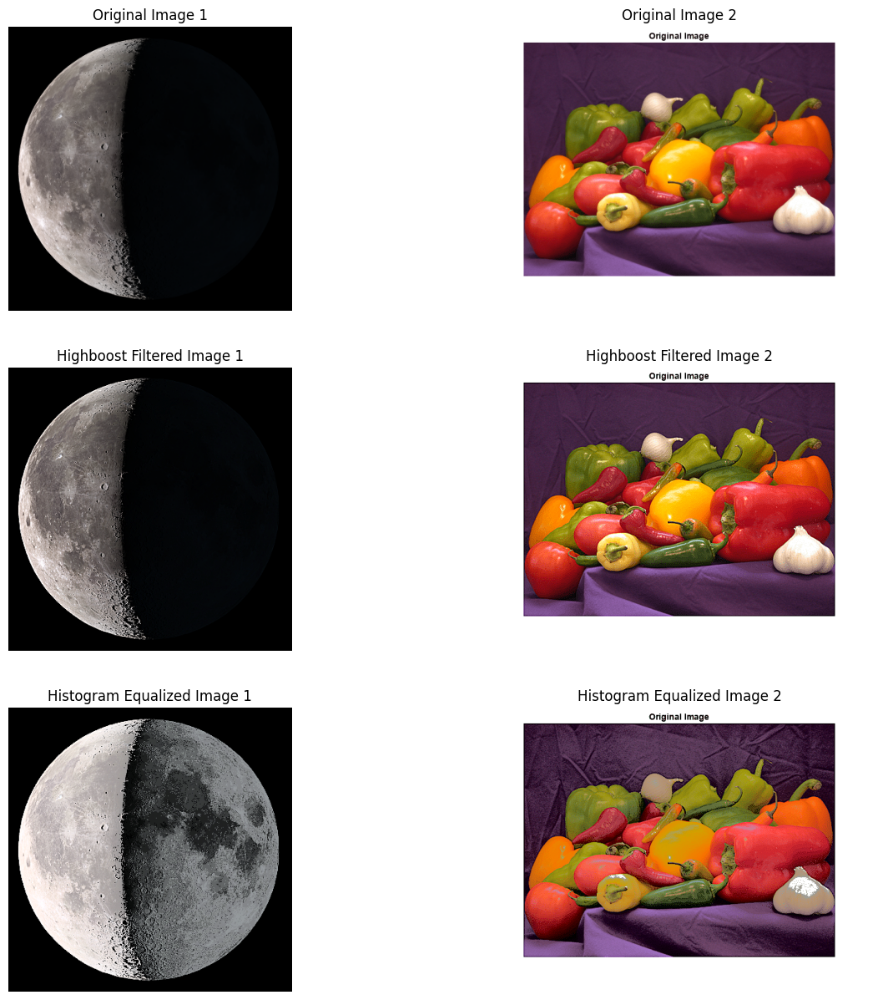

In [98]:
# Display images side by side for comparison
fig, axs = plt.subplots(3, 2, figsize=(15, 15))

# Original images
axs[0, 0].imshow(image1)
axs[0, 0].set_title('Original Image 1')
axs[0, 0].axis('off')

axs[0, 1].imshow(image2)
axs[0, 1].set_title('Original Image 2')
axs[0, 1].axis('off')

# Highboost filtered images
axs[1, 0].imshow(highboost_image1)
axs[1, 0].set_title('Highboost Filtered Image 1')
axs[1, 0].axis('off')

axs[1, 1].imshow(highboost_image2)
axs[1, 1].set_title('Highboost Filtered Image 2')
axs[1, 1].axis('off')

# Histogram equalized images
axs[2, 0].imshow(equalized_image1)
axs[2, 0].set_title('Histogram Equalized Image 1')
axs[2, 0].axis('off')

axs[2, 1].imshow(equalized_image2)
axs[2, 1].set_title('Histogram Equalized Image 2')
axs[2, 1].axis('off')

plt.show()

### Q1 - D

In [107]:
def Adaptive_canny_thresholding(img, percentiles=[90, 95]):
    # Ensure the image is in grayscale
    if len(img.shape) == 3:
        img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

    # Compute gradients in the x and y directions using the Sobel operator
    gradient_x = cv2.Sobel(img, cv2.CV_64F, 1, 0, ksize=3)
    gradient_y = cv2.Sobel(img, cv2.CV_64F, 0, 1, ksize=3)

    # Calculate the magnitude of the gradients
    gradient_magnitude = np.hypot(gradient_x, gradient_y)

    # Calculate the specified percentiles of the gradient magnitudes
    low_threshold, high_threshold = np.percentile(gradient_magnitude, percentiles)
    print(f"Quantiles are: low_threshold={low_threshold}, high_threshold={high_threshold}")

    # Perform Canny edge detection using the dynamic thresholds
    edges = cv2.Canny(img, low_threshold, high_threshold)

    return edges

The function `Adaptive_canny_thresholding` takes an image (`img`) and computes adaptive Canny edge detection thresholds based on specified percentiles of the gradient magnitudes.

1. **Grayscale Conversion**: 
    - If the image is not already in grayscale (3D shape), it converts it to grayscale using OpenCV's `cv2.cvtColor` function.

2. **Gradient Computation**:
    - It computes gradients in the x and y directions using the Sobel operator via OpenCV's `cv2.Sobel` function.
    - This step calculates the rate of change of intensity in the image in both the x and y directions.

3. **Gradient Magnitude Calculation**:
    - The magnitude of the gradients is computed using NumPy's `np.hypot` function.
    - This calculates the overall strength of the gradient at each pixel, representing edges in the image.

4. **Threshold Calculation**:
    - It calculates the specified percentiles of the gradient magnitudes using NumPy's `np.percentile` function.
    - These percentiles determine the low and high thresholds for Canny edge detection.
    - The resulting thresholds are printed for debugging purposes.

5. **Canny Edge Detection**:
    - Finally, it applies Canny edge detection using the dynamic thresholds calculated in the previous step.
    - This step detects edges in the image based on the gradient magnitude and the computed thresholds.

6. **Return**:
    - The resulting edges are returned as the output of the function.

This function allows for adaptive thresholding in Canny edge detection

In [100]:
# Directory
image_dir = '/kaggle/input/computer-vision-hw03-data/Q1'

Quantiles are: low_threshold=59.413803110051795, high_threshold=115.7410903698423


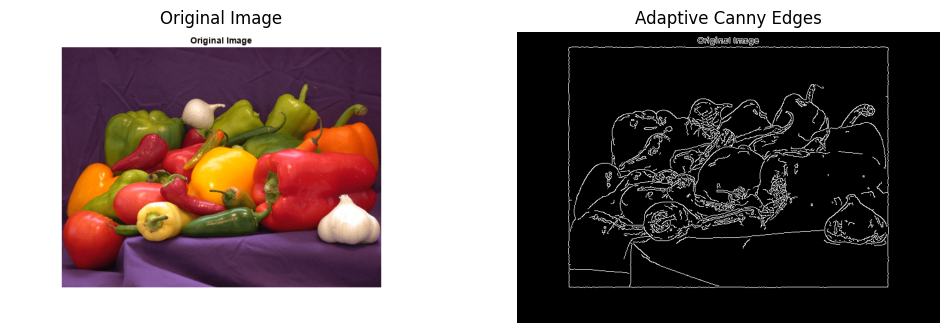

Quantiles are: low_threshold=92.19544457292888, high_threshold=123.90641576246553


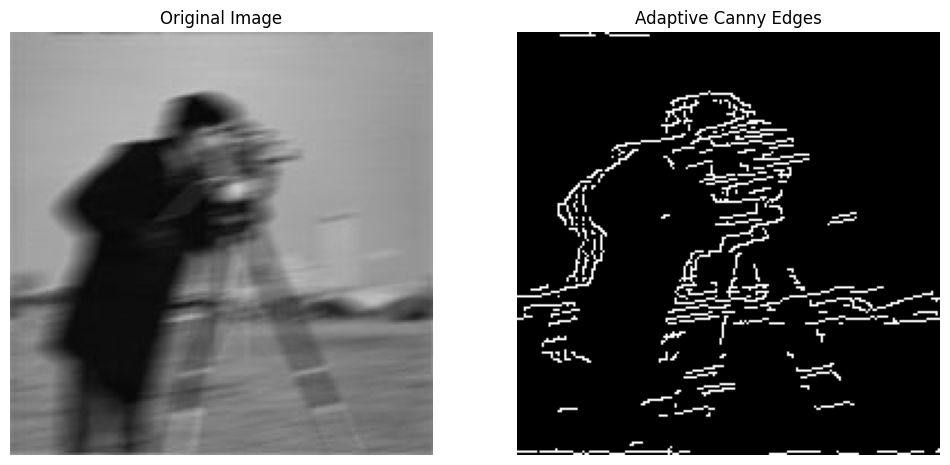

Quantiles are: low_threshold=331.02265783477725, high_threshold=451.2493767308715


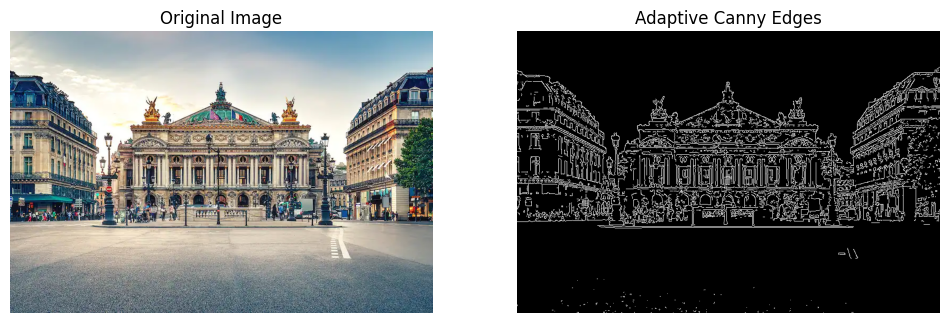

Quantiles are: low_threshold=253.33614032794543, high_threshold=317.32380648602856


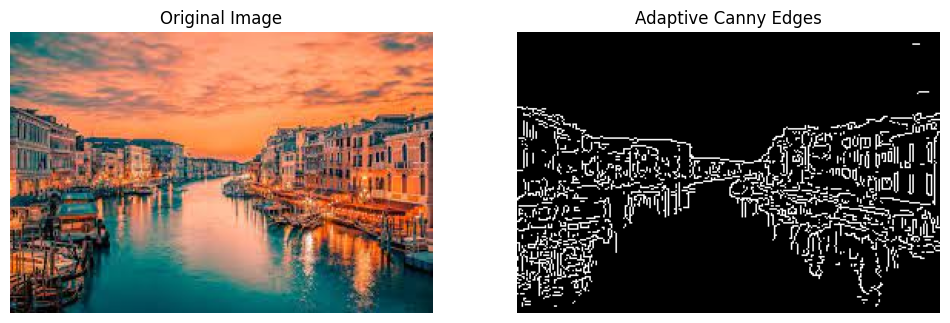

Quantiles are: low_threshold=60.41522986797286, high_threshold=103.0067955447424


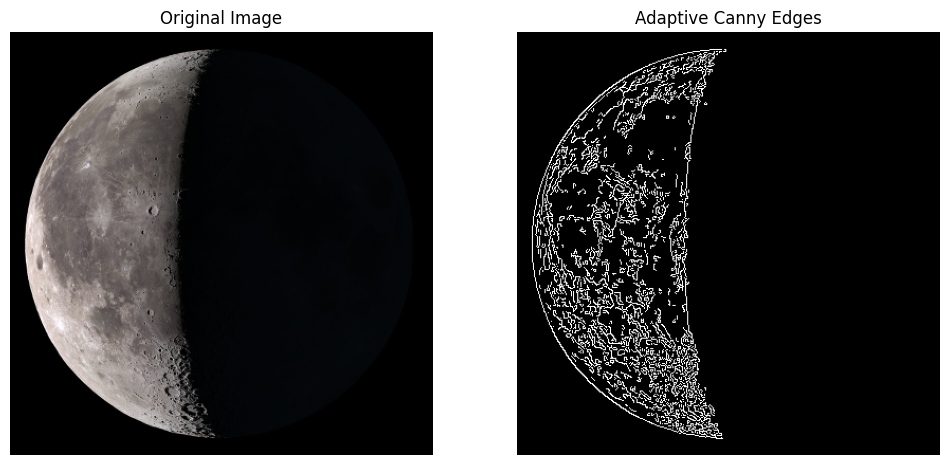

In [101]:
# Loop through the images in the directory
for img_file in os.listdir(image_dir):
    if img_file.endswith('.jpg') or img_file.endswith('.png'):
        # Read the image
        image = cv2.imread(os.path.join(image_dir, img_file))

        # Apply adaptive Canny thresholding
        edges = Adaptive_canny_thresholding(image)

        # Display original and edge-detected images
        plt.figure(figsize=(12, 6))
        plt.subplot(1, 2, 1)
        plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
        plt.title('Original Image')
        plt.axis('off')

        plt.subplot(1, 2, 2)
        plt.imshow(edges, cmap='gray')
        plt.title('Adaptive Canny Edges')
        plt.axis('off')

        plt.show()

### Q2

#### Create a polygon mask to focus on a region of interest.

In [108]:
def region_of_interest(img, ignore_mask_color=255):

    # Create a blank mask of the same size as the image
    mask = np.zeros_like(img)
    
    # Define the vertices of the polygon that defines the region of interest
    imshape = img.shape
    bottom_left = (0, imshape[0])
    top_left = (int(imshape[1] * 0.30), int(imshape[0] * 0.6))
    top_right = (int(imshape[1] * 0.70), int(imshape[0] * 0.6))
    bottom_right = (imshape[1], imshape[0])
    
    vertices = np.array([[bottom_left, top_left, top_right, bottom_right]], dtype=np.int32)
    
    # Fill the mask with the polygon
    cv2.fillPoly(mask, vertices, ignore_mask_color)
    
    return mask


#### Detect lines in the image using Hough Line Transform

In [109]:
def lane_detection(img, rho=2.5, theta=np.pi/180, threshold=65):
    
    computed_img = img.copy()
    hsv_img = cv2.cvtColor(img, cv2.COLOR_RGB2HSV)
    
    gray = hsv_img[:, :, 2]
    
    edges = Adaptive_canny_thresholding(gray)
    
    mask = region_of_interest(edges)
    masked_img = cv2.bitwise_and(edges, mask)
    
    lines = cv2.HoughLinesP(masked_img, rho, theta, threshold, maxLineGap=55, minLineLength=80)
    
    # If lines are detected, draw them on the image
    if lines is not None:
        for line in lines:
            x1, y1, x2, y2 = line[0]
            # Calculate the slope of the line
            m = (y2 - y1) / (x2 - x1)
            # Filter out nearly horizontal lines based on slope
            if -0.3 < m < 0.3:
                continue
            cv2.line(computed_img, (x1, y1), (x2, y2), (0, 0, 255), 4)
    
    return computed_img

#### Process all images in the given folder and display the results

In [110]:
def display_images(original_image, processed_image):
   
    # Convert BGR images to RGB
    original_image_rgb = cv2.cvtColor(original_image, cv2.COLOR_BGR2RGB)
    processed_image_rgb = cv2.cvtColor(processed_image, cv2.COLOR_BGR2RGB)
    
    plt.figure(figsize=(20, 10))
    
    # Display original image
    plt.subplot(1, 2, 1)
    plt.imshow(original_image_rgb)
    plt.title('Original Image')
    plt.axis('off')
    
    # Display processed image
    plt.subplot(1, 2, 2)
    plt.imshow(processed_image_rgb)
    plt.title('Detected Lines')
    plt.axis('off')
    
    plt.show()

In [111]:
def process_and_display_images(folder_path):
    
    # Get list of all image files in the folder
    image_files = glob.glob(os.path.join(folder_path, '*.*'))
    
    for image_file in image_files:
        # Load the image
        image = cv2.imread(image_file)
        
        if image is None:
            print(f"Error: Unable to load image at {image_file}")
            continue
        
        # Detect lines
        image_with_lines = lane_detection(image)
        
        # Display the results
        display_images(image, image_with_lines)

Quantiles are: low_threshold=70.02856560004639, high_threshold=194.48907424325924


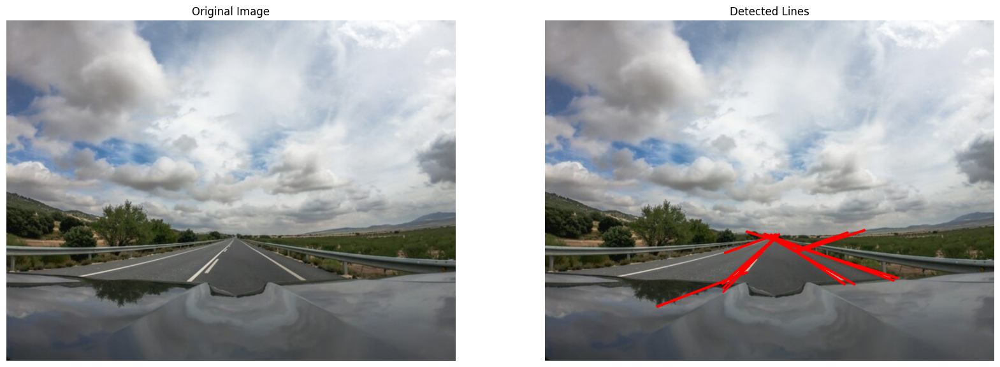

Quantiles are: low_threshold=71.17583859709698, high_threshold=175.31685600648902


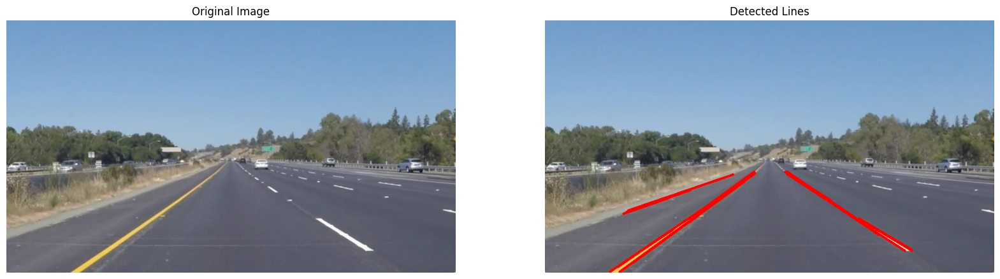

Quantiles are: low_threshold=133.0338302838793, high_threshold=316.4068896008182


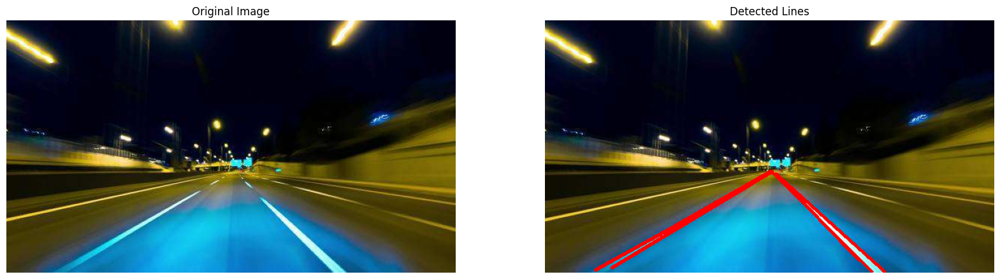

Quantiles are: low_threshold=46.84015371452148, high_threshold=119.33147112141039


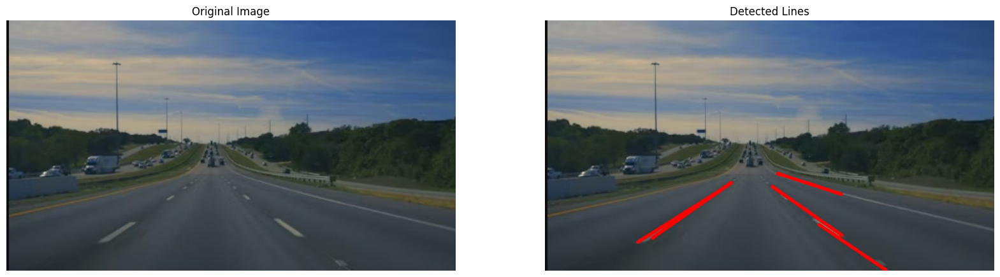

Quantiles are: low_threshold=150.23315213360866, high_threshold=311.0587076880064


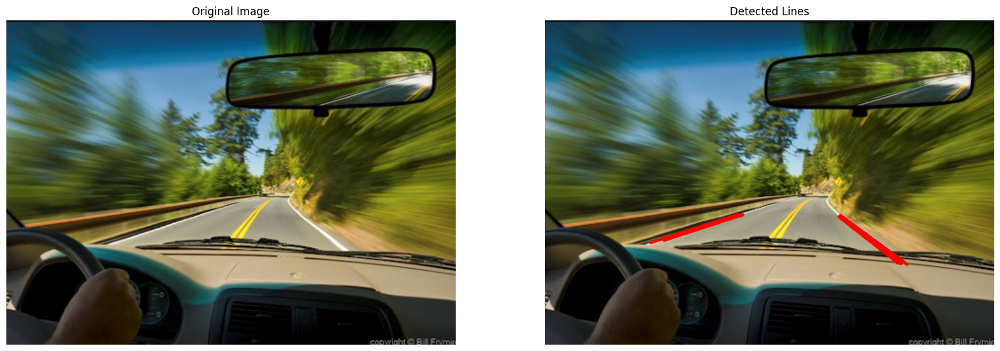

In [112]:
folder_path = '/kaggle/input/computer-vision-hw03-data/Q2'  
process_and_display_images(folder_path)

### Q3

#### Region Matching using HOG

In [8]:
class HOGTemplateMatcher:
    def __init__(self, pixels_per_cell=(8, 8), cells_per_block=(2, 2), step_size=8):
        self.pixels_per_cell = pixels_per_cell
        self.cells_per_block = cells_per_block
        self.step_size = step_size

    # Extract HOG features from an image
    def extract_hog_features(self, image):
        if len(image.shape) == 3:
            image_gray = color.rgb2gray(image)
        else:
            image_gray = image
        return hog(image_gray, pixels_per_cell=self.pixels_per_cell, cells_per_block=self.cells_per_block, visualize=False)

    # Perform sliding window HOG template matching
    def sliding_window_hog(self, target_image, template_hog, template_size):
        target_height, target_width = target_image.shape[:2]
        template_height, template_width = template_size
        best_score = -np.inf
        best_location = None
        for y in range(0, target_height - template_height + 1, self.step_size):
            for x in range(0, target_width - template_width + 1, self.step_size):
                window = target_image[y:y + template_height, x:x + template_width]
                window_hog = self.extract_hog_features(window)
                score = np.dot(window_hog, template_hog)
                if score > best_score:
                    best_score = score
                    best_location = (x, y)
        return best_location, best_score

    # Perform template matching using file paths and HOG features
    def template_matching_hog(self, target_image, template_image):
    
        if target_image is None or template_image is None:
            print(f"Error reading images {target_path} or {template_path}")
            return
        target_image_gray = color.rgb2gray(target_image) if target_image.ndim == 3 else target_image
        template_image_gray = color.rgb2gray(template_image) if template_image.ndim == 3 else template_image
        template_hog = self.extract_hog_features(template_image_gray)
        template_size = template_image_gray.shape
        start_time = time.time()
        best_location, best_score = self.sliding_window_hog(target_image_gray, template_hog, template_size)
        end_time = time.time()
        if best_location is not None:
            print(f"Best match found at location: {best_location} with score: {best_score}")
            print(f"Time taken: {end_time - start_time:.2f} seconds")
            self.visualize_matching(target_image, template_image, best_location)
        else:
            print("No match found")

    # Visualize the template matching result by drawing a rectangle around the best match
    def visualize_matching(self, target_image, template_image, best_location):
        top_left = best_location
        bottom_right = (top_left[0] + template_image.shape[1], top_left[1] + template_image.shape[0])
        cv2.rectangle(target_image, top_left, bottom_right, (0, 255, 0), 2)
        plt.figure(figsize=(15, 10))
        plt.subplot(1, 2, 1)
        plt.imshow(cv2.cvtColor(target_image, cv2.COLOR_BGR2RGB))
        plt.title('Target Image with Template Match')
        plt.axis('off')
        plt.subplot(1, 2, 2)
        plt.imshow(cv2.cvtColor(template_image, cv2.COLOR_BGR2RGB))
        plt.title('Template Image')
        plt.axis('off')
        plt.show()

    # Iterate over all images in the folder and perform template matching for each pair
    def process_images_in_folder(self, org_img, tmpt_imgs):
        
        for i, template in enumerate(tmpt_imgs):
            print(f"Matching template template {i+1} in original image")
            self.template_matching_hog(org_img, template)


Matching template template 1 in original image
Best match found at location: (832, 0) with score: 156.1420964359257
Time taken: 444.28 seconds


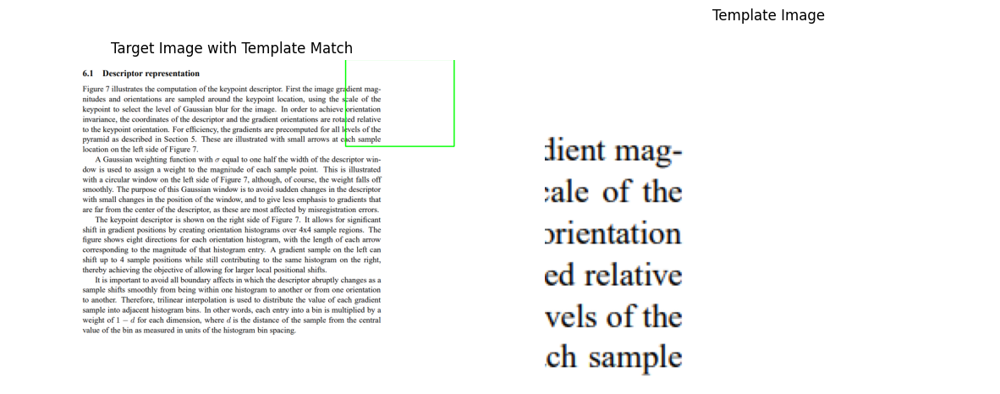

Matching template template 2 in original image
Best match found at location: (464, 376) with score: 113.3409306391646
Time taken: 211.73 seconds


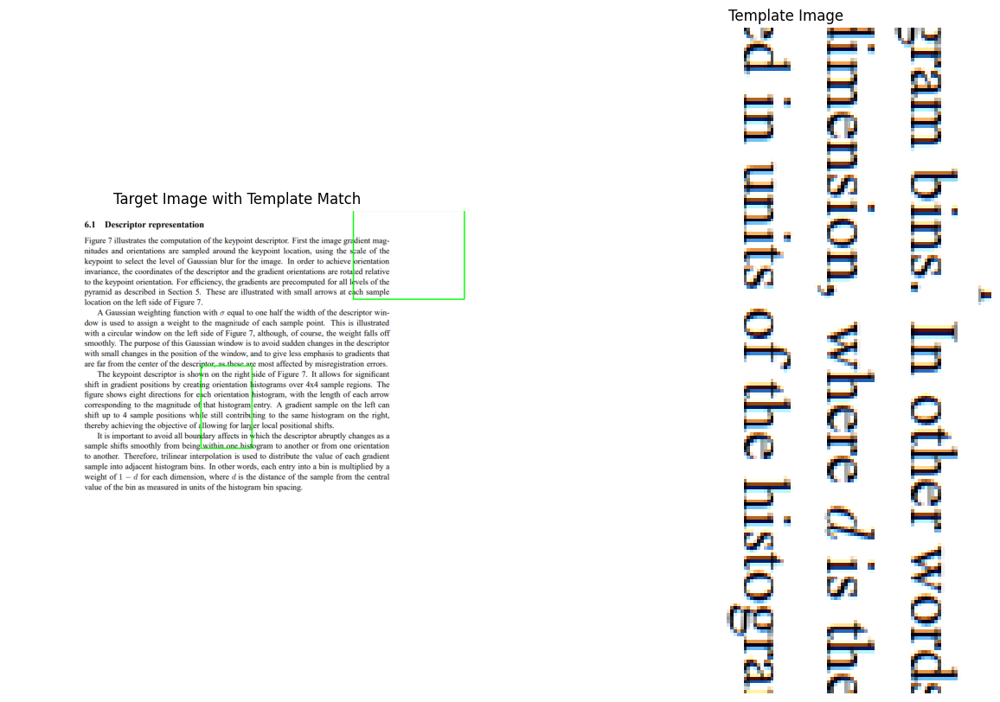

Matching template template 3 in original image
Best match found at location: (272, 344) with score: 379.0221024244716
Time taken: 341.45 seconds


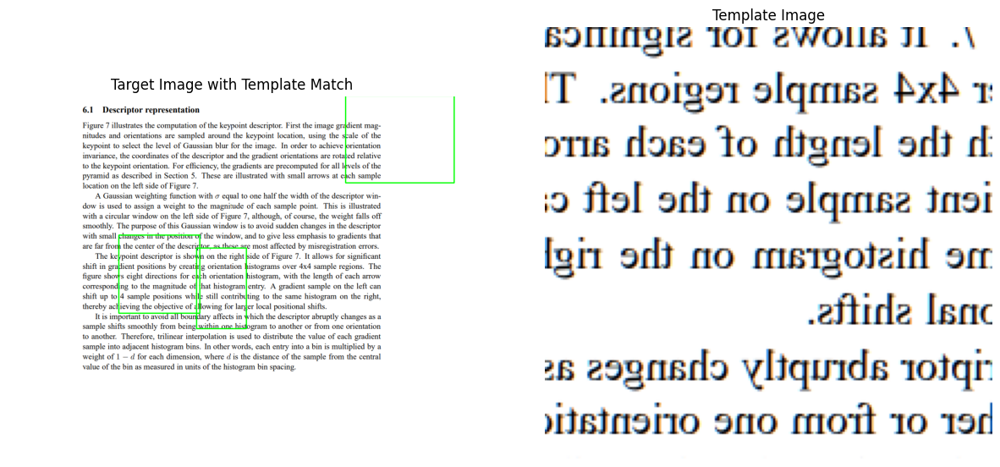

Matching template template 4 in original image
Best match found at location: (216, 112) with score: 1094.8594559230364
Time taken: 553.34 seconds


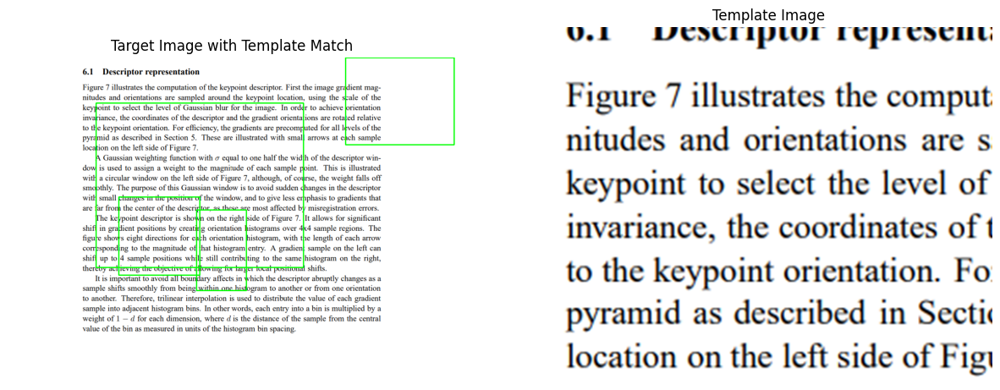

Matching template template 5 in original image
Best match found at location: (120, 152) with score: 549.9378793632834
Time taken: 479.64 seconds


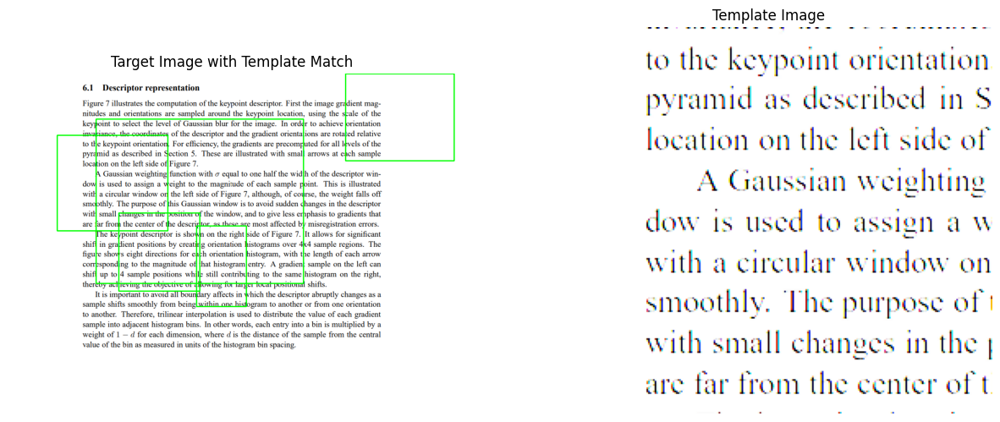

Matching template template 6 in original image
Best match found at location: (344, 320) with score: 539.2072215959815
Time taken: 375.34 seconds


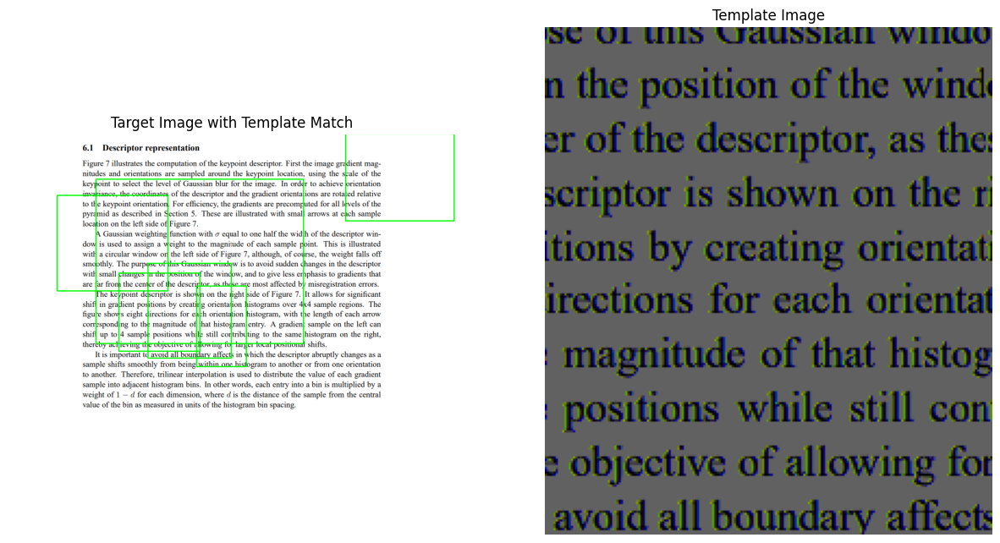

Matching template template 7 in original image
Best match found at location: (144, 8) with score: 551.9117799940065
Time taken: 504.31 seconds


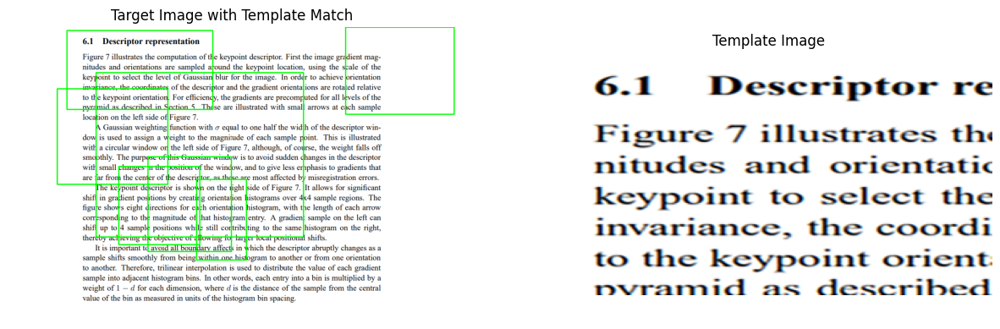

Matching template template 8 in original image
Best match found at location: (504, 344) with score: 488.3368839236467
Time taken: 377.05 seconds


In [ ]:
# Load images
original_image = cv2.imread('/kaggle/input/computer-vision-hw03-data/Q3/3.0.png')
template_images = [cv2.imread(f'/kaggle/input/computer-vision-hw03-data/Q3/3.{i}.png') for i in range(1, 9)]
matcher = HOGTemplateMatcher()
matcher.process_images_in_folder(original_image, template_images)

In [11]:
def extract_sift_features(image):
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    sift = cv2.SIFT_create()
    keypoints, descriptors = sift.detectAndCompute(gray, None)
    return keypoints, descriptors

In [12]:
def match_features(des1, des2):
    bf = cv2.BFMatcher(cv2.NORM_L2, crossCheck=True)
    matches = bf.match(des1, des2)
    matches = sorted(matches, key=lambda x: x.distance)
    return matches

In [13]:
def draw_matches(img1, kp1, img2, kp2, matches):
    img_matches = cv2.drawMatches(img1, kp1, img2, kp2, matches, None, flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)
    return img_matches

In [14]:
def find_homography_and_draw_box(original_img, template_img, kp1, kp2, matches):
    if len(matches) >= 4:
        src_pts = np.float32([kp1[m.queryIdx].pt for m in matches]).reshape(-1, 2)
        dst_pts = np.float32([kp2[m.trainIdx].pt for m in matches]).reshape(-1, 2)

        H, mask = cv2.findHomography(dst_pts, src_pts, cv2.RANSAC, 5.0)
        h, w, _ = template_img.shape
        pts = np.float32([[0, 0], [0, h], [w, h], [w, 0]]).reshape(-1, 1, 2)
        dst = cv2.perspectiveTransform(pts, H)

        original_img_with_box = cv2.polylines(original_img, [np.int32(dst)], True, (0, 255, 0), 3, cv2.LINE_AA)
        return original_img_with_box
    else:
        return original_img

In [16]:
# Load images
original_image = cv2.imread('/kaggle/input/computer-vision-hw03-data/Q3/3.0.png')
template_images = [cv2.imread(f'/kaggle/input/computer-vision-hw03-data/Q3/3.{i}.png') for i in range(1, 9)]

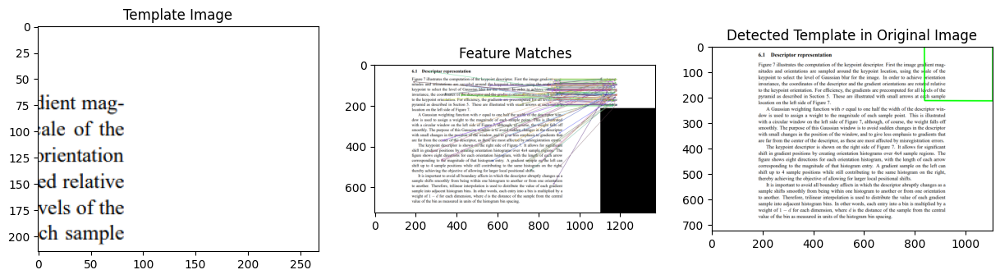

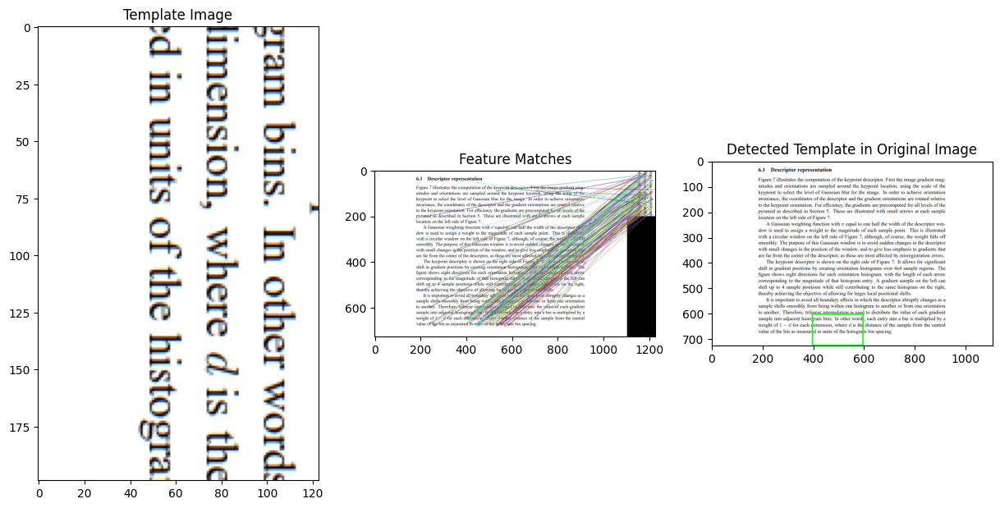

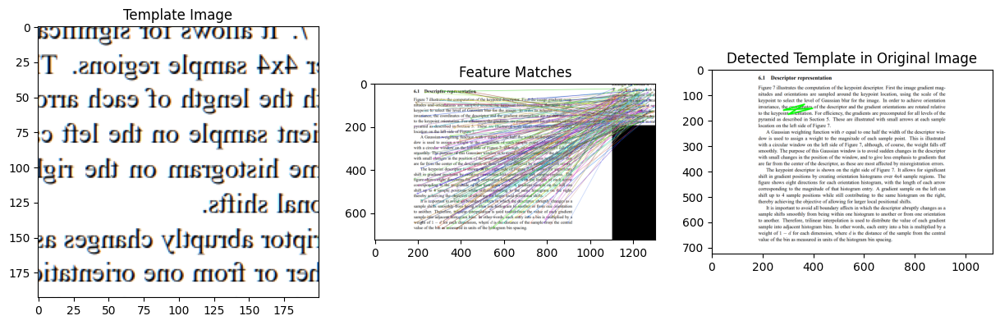

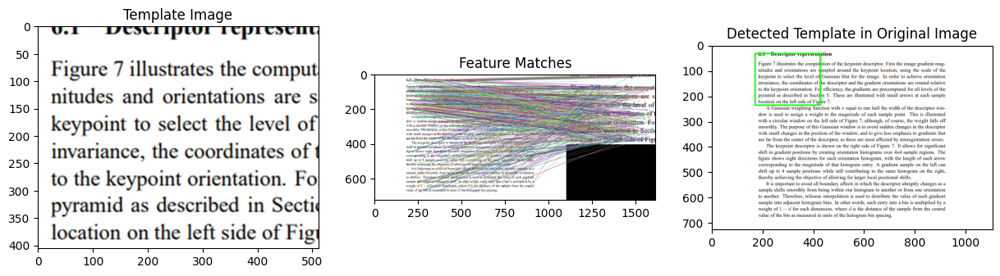

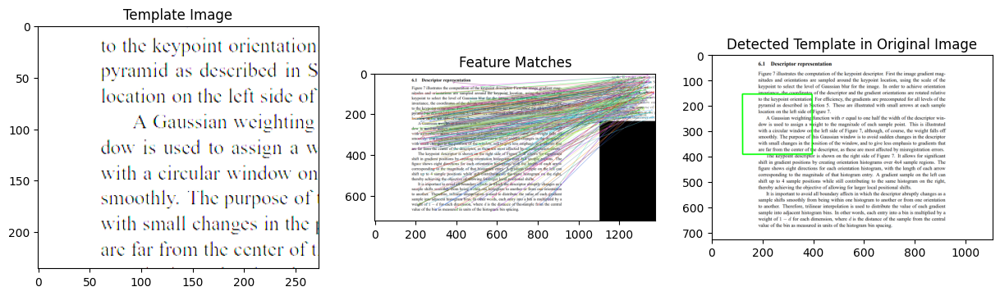

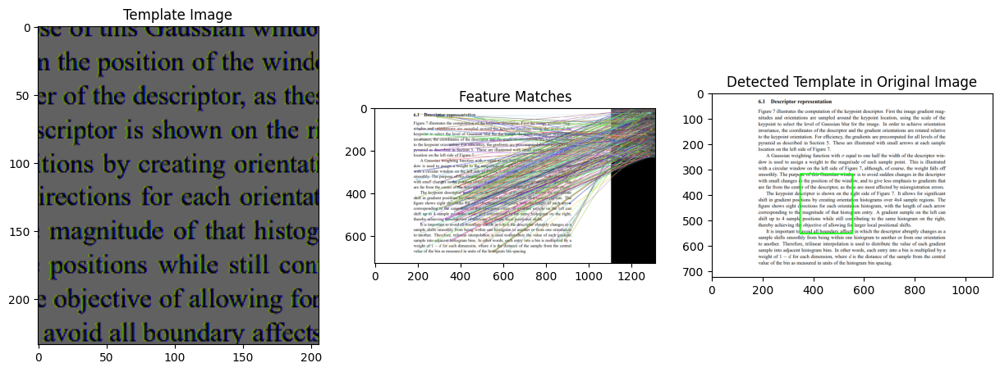

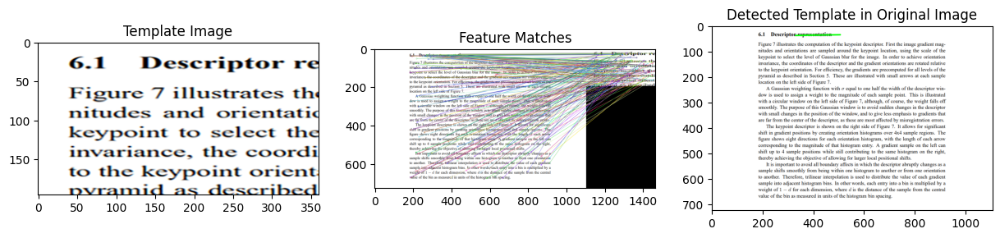

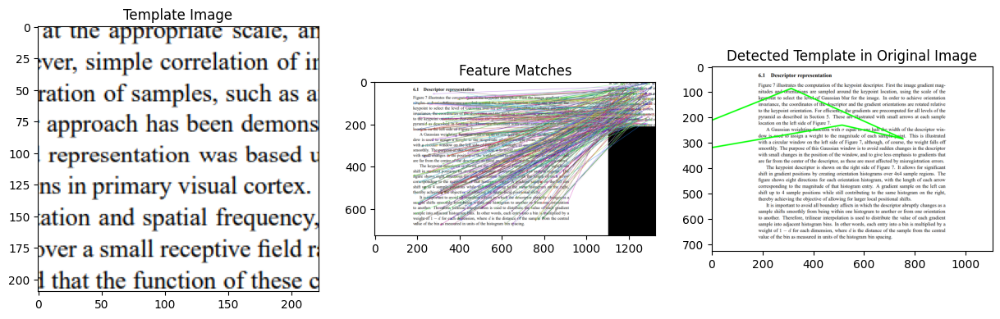

In [17]:
for idx, template_image in enumerate(template_images):
    
    # Extract SIFT features
    kp1, des1 = extract_sift_features(original_image)
    kp2, des2 = extract_sift_features(template_image)

    # Match features
    matches = match_features(des1, des2)

    # Draw matches for visualization
    img_matches = draw_matches(original_image, kp1, template_image, kp2, matches)

    # Find homography and draw bounding box
    result_image = find_homography_and_draw_box(original_image.copy(), template_image, kp1, kp2, matches)

    # Display results
    plt.figure(figsize=(15, 10))
    plt.subplot(1, 3, 1)
    plt.title('Template Image')
    plt.imshow(cv2.cvtColor(template_image, cv2.COLOR_BGR2RGB))
    
    plt.subplot(1, 3, 2)
    plt.title('Feature Matches')
    plt.imshow(cv2.cvtColor(img_matches, cv2.COLOR_BGR2RGB))
    
    plt.subplot(1, 3, 3)
    plt.title('Detected Template in Original Image')
    plt.imshow(cv2.cvtColor(result_image, cv2.COLOR_BGR2RGB))
    
    plt.show()


### SIFT (Scale-Invariant Feature Transform)

SIFT is an algorithm for detecting and describing local features in images, excelling in keypoint matching due to its robustness against various transformations and distortions.

#### Key Steps in SIFT:

1. **Scale-Space Extrema Detection**: Identifies keypoints by searching across multiple scales using a Difference of Gaussians (DoG) function.
2. **Keypoint Localization**: Refines detected keypoints to sub-pixel accuracy, discarding low-contrast points or poorly localized points.
3. **Orientation Assignment**: Assigns an orientation to each keypoint based on local image gradient directions, ensuring rotation invariance.
4. **Descriptor Generation**: Constructs a descriptor by calculating gradient magnitudes and orientations in a local neighborhood, forming a 128-dimensional vector.

#### Invariances of SIFT:

- **Scale Invariance**: Multi-scale detection ensures robustness to changes in scale.
- **Rotation Invariance**: Orientation assignment makes descriptors invariant to rotation.
- **Affine Invariance**: Robust to affine transformations due to local feature description.
- **Illumination Invariance**: Uses gradient information rather than raw pixel values, reducing sensitivity to lighting changes.

### HOG (Histogram of Oriented Gradients)

HOG is a feature descriptor for object detection, capturing the shape and appearance of objects by computing the distribution of gradient orientations.

#### Key Steps in HOG:

1. **Gradient Computation**: Calculates image gradients, typically using Sobel kernels.
2. **Orientation Binning**: Divides the image into cells, creating a histogram of gradient directions for each cell.
3. **Block Normalization**: Groups cells into larger blocks and normalizes the histograms to improve invariance to illumination and contrast changes.
4. **Descriptor Generation**: Concatenates normalized histograms from all blocks to form the final feature descriptor.

#### Invariances of HOG:

- **Translation Invariance**: Overlapping blocks make the descriptor less sensitive to small translations.
- **Illumination and Contrast Invariance**: Block normalization mitigates lighting and contrast variations.
- **Partial Rotation Invariance**: Handles minor rotations due to gradient orientation histograms.

### Region and Keypoint Matching

- **SIFT**: Ideal for matching specific keypoints across images, robust to scale and rotation changes. Suitable for image stitching, object recognition, and 3D reconstruction.
- **HOG**: Primarily used for object detection within regions, excelling in scenarios requiring shape and appearance analysis, such as pedestrian detection.

### SIFT's Advantages over HOG

1. **Robustness to Scale and Rotation**: Multi-scale detection and orientation assignment enhance robustness to changes in scale and rotation.
2. **Distinctive Feature Matching**: The 128-dimensional descriptor provides detailed representation, leading to more accurate keypoint matching.
3. **Performance in Noisy Environments**: Keypoint localization and refinement improve accuracy in noisy conditions.
4. **Application Versatility**: Suitable for a wider range of applications, including 3D reconstruction and object tracking.


As a result, based on the discussed content, the functionality of each algorithm, and their respective invariances, it can be observed that HOG does not have invariance to rotation, flipping, or even large scale changes. However, it performs well with images that have different stretching and even varying contrast.

On the other hand, SIFT has more invariances and applications in obtaining feature points and keypoints. From its performance, it can be seen that SIFT has invariance to rotation, flipping, and contrast changes, unlike HOG. However, it does not have invariance to image stretching, which HOG does handle.

Here, the results of each algorithm are displayed as the original image, the target image, and the target matching in the original image. In the SIFT algorithm, the output includes matching keypoints, and the incorrect outputs that can be clearly seen indicate that these algorithms could not recognize the target images as part of the original image. Overall, it can be seen that SIFT performed relatively better than HOG, and the errors shown correctly align with the discussed explanations and characteristics of each algorithm. And neither of them can have invariance to flipping.